<a href="https://colab.research.google.com/github/jiansim03/AIFFEL_ONLINE_QUEST/blob/main/Quest07/flowers_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 이미지 분류기 만들기
---

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# 텐서플로 버전 확인
import tensorflow as tf
print(tf.__version__)

2.6.0


## Step 1. 데이터셋 내려받기
---

In [ ]:
import tensorflow_datasets as tfds
tfds.__version__

'4.4.0'

## Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기
---
이미지를 모두 같은 크기로 formatting 한 후, train_batches, validation_batches, test_batches를 준비합니다.


In [ ]:
!mkdir -p ~/aiffel/cats_vs_dogs1/PetImages # 해당경로 폴더 생성
!ln -s ~/data/* ~/aiffel/cats_vs_dogs1/ # ~/data/*의 파일들을 다음 경로의 링크로 연결

In [ ]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/cats_vs_dogs1/',
    download=True,
    with_info=True,
    as_supervised=True,
)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /aiffel/aiffel/cats_vs_dogs1/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [ ]:
raw_train, raw_validation, raw_test

(<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>,
 <PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>,
 <PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>)

In [ ]:
# 시각화 라이브러리 가져오기
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

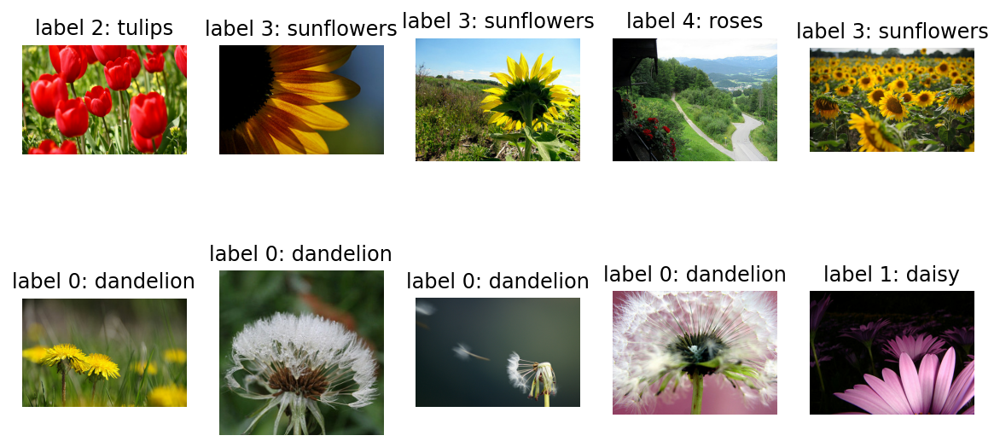

In [ ]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)): # 10개 데이터 가져오기
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### 이미지 같은 포맷으로 통일

In [ ]:
IMG_SIGE = 160

def format_example(image, label):
    image = tf.cast(image, tf.float32) # float32로 변환
    image = (image/127.5)-1
    image = tf.image.resize(image, (IMG_SIGE, IMG_SIGE))
    return image, label

In [ ]:
# raw 데이터를 변환해준다
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


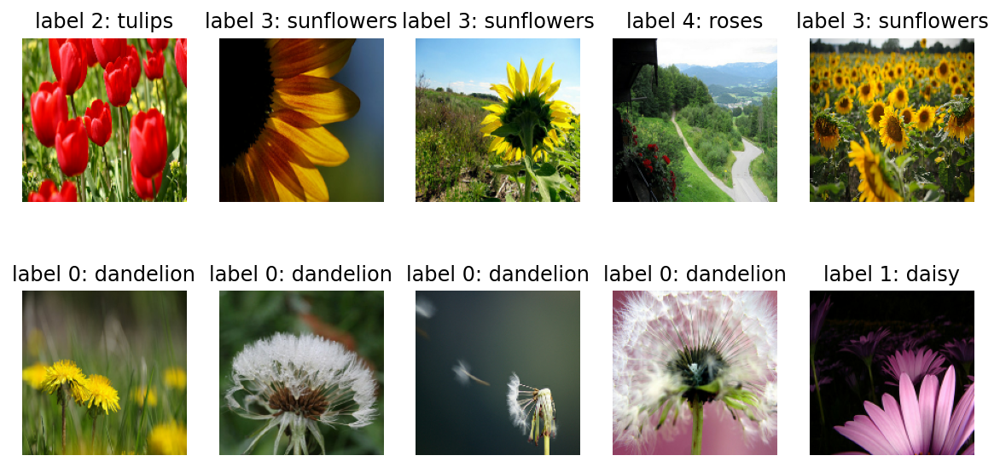

In [ ]:
# matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, -1~1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환한다
plt.figure(figsize=(10,5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

## Step 3. 모델 설계하기
- tf_flowers : class의 갯수가 5가지

In [ ]:
IMG_SIZE = 160

IMG_SHAPE =(IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                        include_top=False,
                                        weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


In [ ]:
# 위에서 만든 함수로 이미지 타입변환 & 스케일링 진행
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


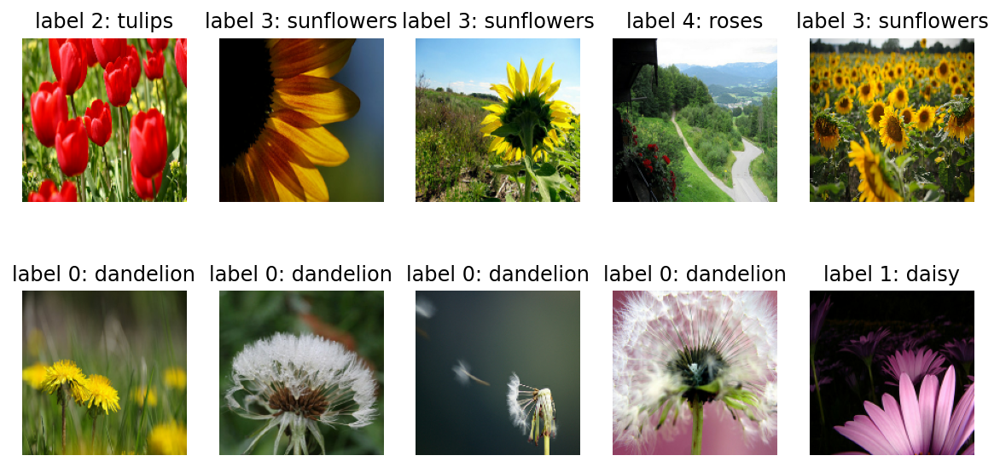

In [ ]:
# 시각화
# matplotlib으로 이미지를 시각화 할 경우에는 모든 픽셀값이 양수여야 하므로, -1~1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환한다
plt.figure(figsize=(10,5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### 텐서플로로 구조 설계

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [ ]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

## Step 4. 모델 학습시키기

In [ ]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
             loss=tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

In [ ]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [ ]:
# BATCH_SIZE에 따라 32개의 데이터를 랜덤으로 뿌려줄 train_batches, validation_batches, test_batches를 만든다
# train_batches는 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공해 준다

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [ ]:
# train_batches에서 하나의 batch만 꺼내 데이터 확인해보자
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape # batch 크기 만큼의 resize된 이미지와 label을 확인할 수 있다.

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [ ]:
# 초기 모델의 성능을 확인해보자 (학습 안 한 상태)
# validation(검증)을 하기 위한 데이터셋인 validation_batches를 이용해 20번의 예측을 해 보고, 평균 loss와 평균 accuracy를 확인해 본다

validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

# loss: 1.5971 - accuracy: 0.2589

11/20 [===============>..............] - ETA: 0s - loss: 1.5927 - accuracy: 0.2670WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 0s 7ms/step - loss: 1.5971 - accuracy: 0.2589
initial loss: 1.60
initial accuracy: 0.26


In [ ]:
# 학습
EPOCHS = 10
history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 6s 41ms/step - loss: 1.3692 - accuracy: 0.4319 - val_loss: 1.1476 - val_accuracy: 0.5395
Epoch 2/10
92/92 [==============================] - 3s 29ms/step - loss: 1.0622 - accuracy: 0.5773 - val_loss: 1.0733 - val_accuracy: 0.5640
Epoch 3/10
92/92 [==============================] - 3s 29ms/step - loss: 0.9306 - accuracy: 0.6386 - val_loss: 0.9786 - val_accuracy: 0.6322
Epoch 4/10
92/92 [==============================] - 3s 29ms/step - loss: 0.8336 - accuracy: 0.6805 - val_loss: 0.9518 - val_accuracy: 0.6431
Epoch 5/10
92/92 [==============================] - 3s 29ms/step - loss: 0.7398 - accuracy: 0.7313 - val_loss: 0.9659 - val_accuracy: 0.6349
Epoch 6/10
92/92 [==============================] - 3s 29ms/step - loss: 0.6476 - accuracy: 0.7735 - val_loss: 0.9445 - val_accuracy: 0.6485
Epoch 7/10
92/92 [==============================] - 3s 29ms/step - loss: 0.5671 - accuracy: 0.8007 - val_loss: 0.9658 - val_accuracy: 0.6267
Epoch 8/10
92

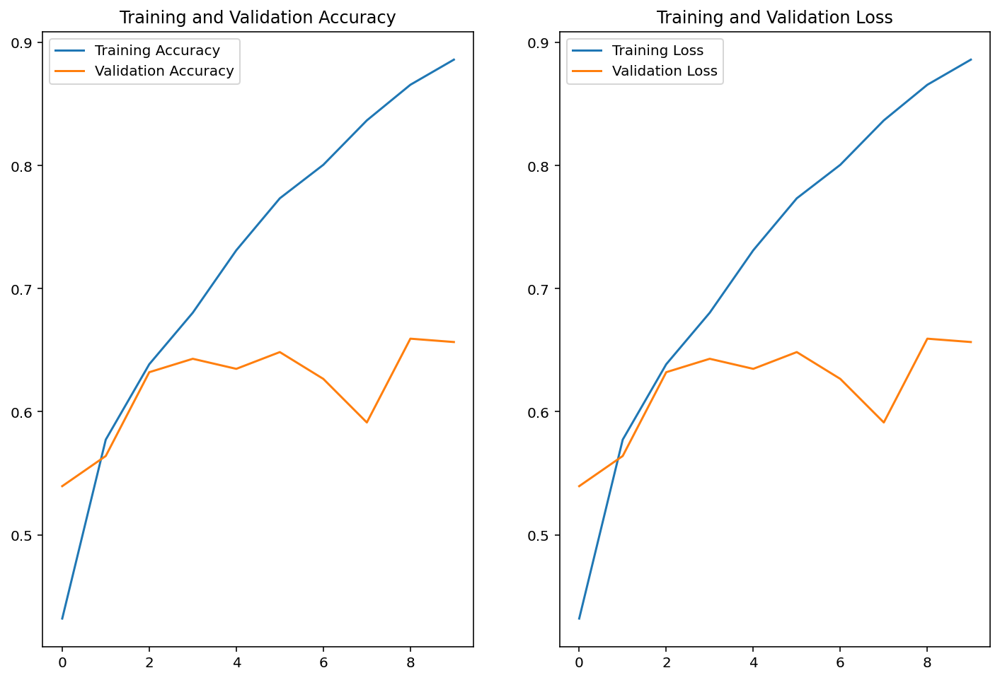

In [ ]:
# 시각화
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1) # 1행의 2개의 서브플롯 중 1번째 서브플롯에 그린다
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2) # 1행의 2개의 서브플롯 중 2번째 서브플롯에 그린다
plt.plot(epochs_range, acc, label='Training Loss')
plt.plot(epochs_range, val_acc, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.show()

# train에선 accuracy가 꾸준히 증가하나, validation에선 불안정하면서 소폭 증가하다 멈춘다.

In [ ]:
# 예측
# # test용 데이터에서 1개 배치만큼 꺼낸 후, 배치 안의 개별 데이터에 대해 예측 반복 수행
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions # 5개 클래스에 대한 확률값 배열이 출력된다

array([[8.51492677e-03, 6.60068414e-04, 5.87096393e-01, 6.58221170e-02,
        3.37906480e-01],
       [7.87505984e-01, 2.01246187e-01, 6.33092644e-03, 1.32641246e-04,
        4.78433119e-03],
       [6.91880226e-01, 2.30241939e-02, 1.37007862e-01, 1.46116614e-01,
        1.97103131e-03],
       [7.05317259e-02, 4.11900654e-02, 5.56230187e-01, 1.06647285e-02,
        3.21383238e-01],
       [7.88383126e-01, 2.28605513e-02, 4.09588106e-02, 2.95518525e-03,
        1.44842327e-01],
       [1.15325354e-01, 5.48638329e-02, 1.65920034e-01, 1.66565143e-02,
        6.47234261e-01],
       [4.24824859e-04, 1.97477639e-02, 7.78456628e-01, 2.17609596e-03,
        1.99194700e-01],
       [2.07716618e-02, 3.23199742e-02, 1.00850739e-01, 2.16431990e-02,
        8.24414432e-01],
       [6.36118324e-03, 6.32301526e-05, 8.25044140e-03, 9.85173225e-01,
        1.51986635e-04],
       [9.91965890e-01, 6.57267682e-03, 5.53546124e-04, 4.80040253e-05,
        8.59896420e-04],
       [9.95176196e-01, 1.4743

In [ ]:
import numpy as np
predictions = np.argmax(predictions, axis=1) # 2차원 배열에 대해 각 행에 대하여 최대값인 인덱스 반환
predictions

array([2, 0, 0, 2, 0, 4, 2, 4, 3, 0, 0, 3, 3, 2, 0, 3, 2, 3, 2, 4, 2, 0,
       2, 0, 1, 2, 4, 4, 2, 1, 0, 0])

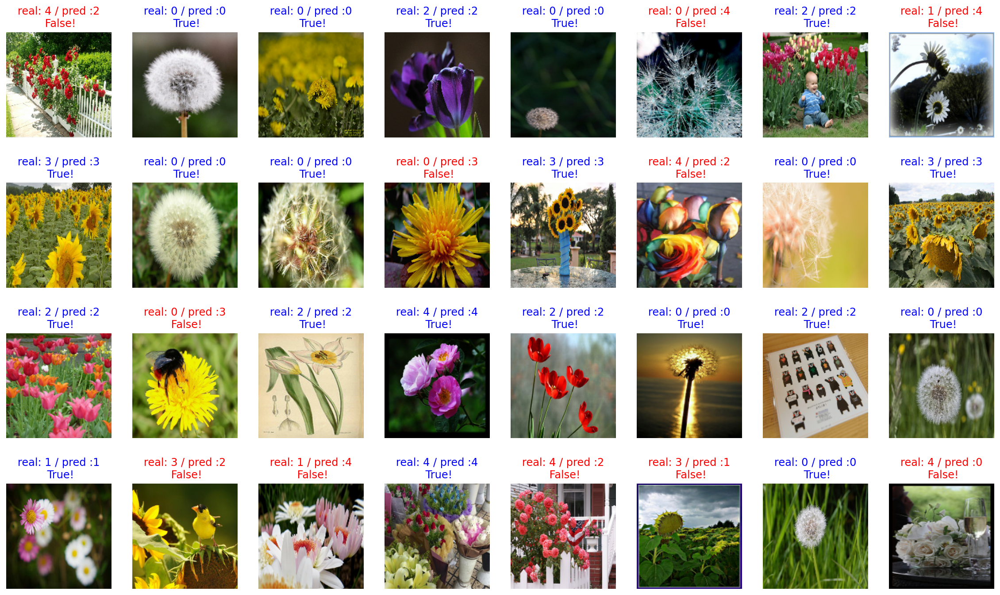

In [ ]:
# 시각화하여 예측 결과를 확인해보자
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction # 예측값이 맞았는지 판단
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
# 32개 이미지에 대한 정확도 계산
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction :
        count += 1


print(count / 32 * 100)

65.625


### 사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [ ]:
IMG_SHAPE =(IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                        include_top=False,
                                        weights='imagenet')

In [ ]:
# 학습시 사용했던 image_batch의 원래사이즈 확인
image_batch.shape

TensorShape([32, 160, 160, 3])

In [ ]:
# 모델에 위 배치를 넣어보자
feature_batch = base_model(image_batch)
feature_batch.shape # output featuremap 사이즈. 특징벡터라고도 부른다

TensorShape([32, 5, 5, 512])

In [ ]:
# 모델에 위 배치 이미지 넣고 형태 보기
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [ ]:
# GlovalAveragePooling 후 변화 양상 보기
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average)
print(feature_batch_average.shape)

tf.Tensor(
[[0.02520115 0.         0.56208026 ... 0.00657796 1.3582817  0.19106106]
 [0.07336584 0.         0.5036216  ... 0.         0.38524818 0.        ]
 [0.17937805 0.         0.8997404  ... 0.         0.96264845 0.        ]
 ...
 [0.02011245 0.         0.45847267 ... 0.00608629 0.44611877 0.        ]
 [0.13797054 0.         0.38204345 ... 0.         0.56908005 0.15286566]
 [0.30851382 0.         1.2254838  ... 0.01394058 0.42941856 0.        ]], shape=(32, 512), dtype=float32)
(32, 512)


In [ ]:
# classifier
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# 순서대로 레이어 구성
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 5)


In [ ]:
base_model.trainable = False # 사전 학습 모델의 가중치 고정

In [ ]:
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])

In [ ]:
# 모델 구조 확인
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
base_learning_rate = 0.0001

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
             loss=tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

## Step 5. 모델 성능 평가하기

In [ ]:
# 평가
validation_step=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

# initial loss: 1.07
# initial accuracy: 0.53

12/20 [=================>............] - ETA: 1s - loss: 1.5997 - accuracy: 0.2480WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 7s 139ms/step - loss: 1.5997 - accuracy: 0.2480
initial loss: 1.60
initial accuracy: 0.25


In [ ]:
EPOCHS = 30

history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/30
92/92 [==============================] - 8s 80ms/step - loss: 0.4479 - accuracy: 0.8573 - val_loss: 0.5052 - val_accuracy: 0.8174
Epoch 2/30
92/92 [==============================] - 8s 80ms/step - loss: 0.4386 - accuracy: 0.8569 - val_loss: 0.5041 - val_accuracy: 0.8147
Epoch 3/30
92/92 [==============================] - 8s 81ms/step - loss: 0.4296 - accuracy: 0.8610 - val_loss: 0.4910 - val_accuracy: 0.8283
Epoch 4/30
92/92 [==============================] - 8s 82ms/step - loss: 0.4202 - accuracy: 0.8644 - val_loss: 0.4826 - val_accuracy: 0.8365
Epoch 5/30
92/92 [==============================] - 8s 82ms/step - loss: 0.4126 - accuracy: 0.8651 - val_loss: 0.4907 - val_accuracy: 0.8311
Epoch 6/30
92/92 [==============================] - 8s 83ms/step - loss: 0.4043 - accuracy: 0.8723 - val_loss: 0.4890 - val_accuracy: 0.8174
Epoch 7/30
92/92 [==============================] - 8s 83ms/step - loss: 0.3969 - accuracy: 0.8702 - val_loss: 0.4756 - val_accuracy: 0.8365
Epoch 8/30
92

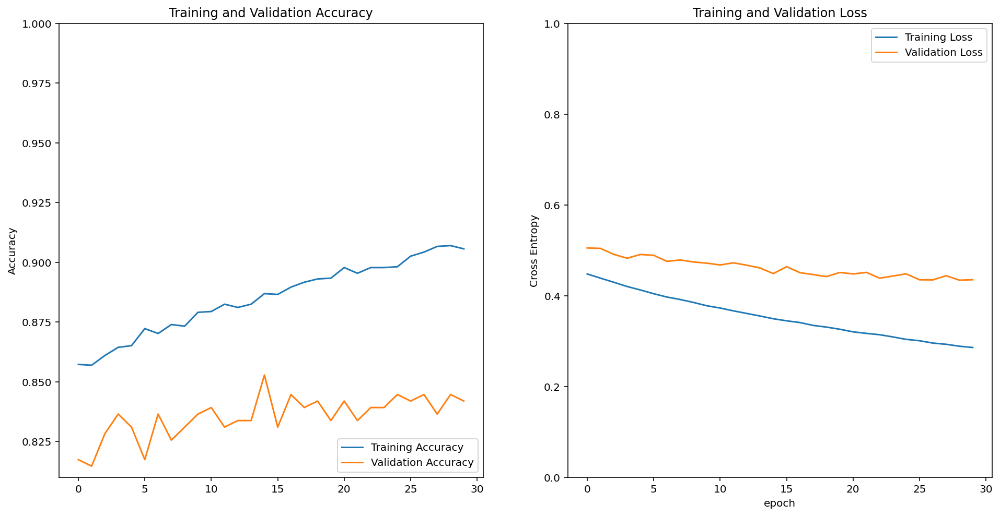

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
# 32개 test sample에 대해서 예측
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[2.15533562e-03, 1.03856567e-02, 9.06586826e-01, 5.77029306e-03,
        7.51019716e-02],
       [9.99966383e-01, 2.94270885e-05, 7.60918795e-08, 3.80406448e-07,
        3.74763340e-06],
       [6.17721796e-01, 1.57632172e-01, 1.51688606e-02, 1.89874426e-01,
        1.96026787e-02],
       [1.39200449e-04, 5.65211056e-04, 6.29585862e-01, 4.97510482e-04,
        3.69212151e-01],
       [7.42826819e-01, 2.34128475e-01, 5.75596793e-03, 7.52250571e-03,
        9.76629462e-03],
       [9.71001029e-01, 1.85825955e-02, 1.11385377e-03, 9.01978649e-03,
        2.82716093e-04],
       [2.02554138e-03, 8.67191178e-04, 9.67660248e-01, 1.60875078e-02,
        1.33595448e-02],
       [3.21584523e-01, 6.62201822e-01, 1.22688565e-04, 1.54197868e-02,
        6.71213435e-04],
       [8.80668813e-04, 4.41233969e-05, 5.82819991e-03, 9.77467000e-01,
        1.57799553e-02],
       [9.99869823e-01, 1.26155239e-04, 1.68526824e-07, 3.33628282e-06,
        6.03273804e-07],
       [9.76344228e-01, 2.1275

In [ ]:
import numpy as np
predictions = np.argmax(predictions, axis=1) # 각 행에 대해 최고값의 index 반환
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 2, 4, 4, 3, 0, 4])

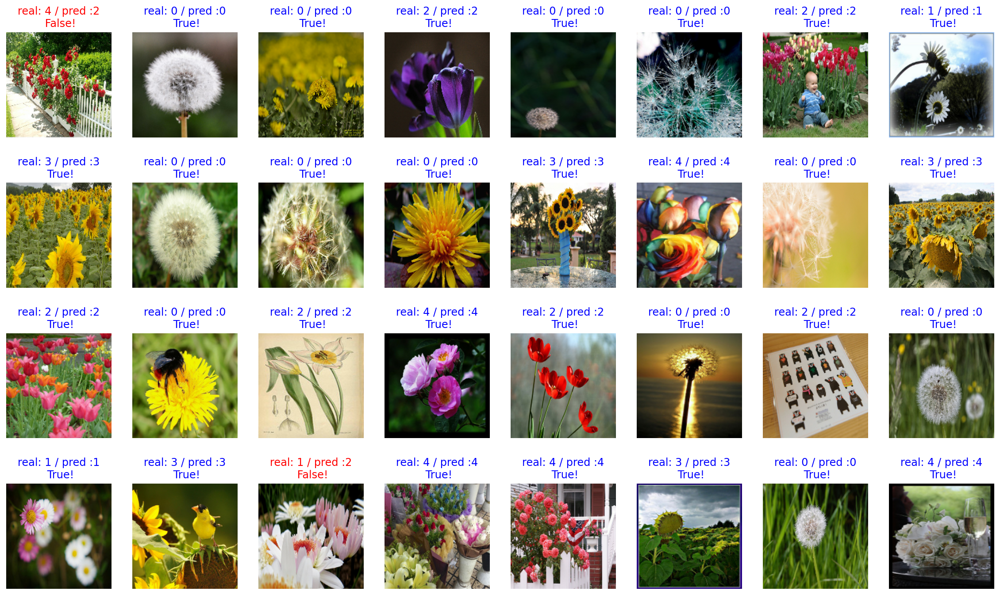

In [ ]:
# 맞았는지 여부 시각화 (맞으면 파란색, 틀리면 빨간색으로 제목 표시)
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [ ]:
# 32개에 대한 정확도 확인
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

# 93.75

93.75


## Step 6. 모델 활용하기

In [ ]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
!mkdir -p ~/aiffel/cats_vs_dogs1/checkpoint
!mkdir -p ~/aiffel/cats_vs_dogs1/images

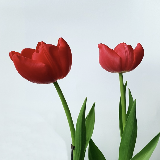

In [ ]:
IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/cats_vs_dogs1/"
flower_image_path = os.path.join(img_dir_path, 'flower1.png')

flower_image = load_img(flower_image_path, target_size=(IMG_SIZE, IMG_SIZE))
flower_image

In [ ]:
# 예측을 위해 numpy array로 변환 + 리사이즈
flower_image = img_to_array(flower_image).reshape(1, IMG_SIZE, IMG_SIZE, 3) # 이미지 1장이니 batch 크기도 1
flower_image.shape

(1, 160, 160, 3)

In [ ]:
prediction = model.predict(flower_image)
prediction

array([[0., 0., 1., 0., 0.]], dtype=float32)

In [ ]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulip_percentage = round(prediction[2] * 100)
    sunflower_percentage = round(prediction[3] * 100)
    rose_percentage = round(prediction[4] * 100)


    print('dandelion:',dandelion_percentage,'daisy:', daisy_percentage,'tulip',tulip_percentage,'sunflower',sunflower_percentage,'rose',rose_percentage,
    )

dandelion: 0 daisy: 0 tulip 100 sunflower 0 rose 0


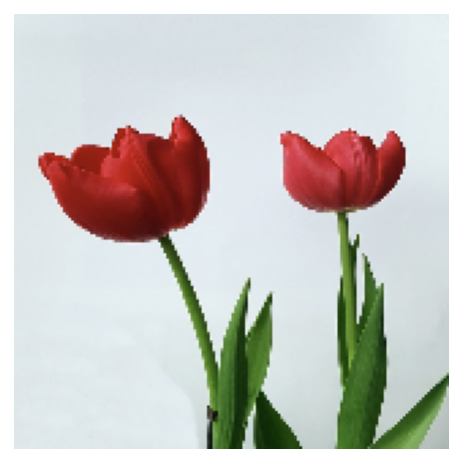

In [ ]:
filename = 'flower1.png'
show_and_predict_image(img_dir_path, filename)

dandelion: 0 daisy: 0 tulip 0 sunflower 0 rose 100


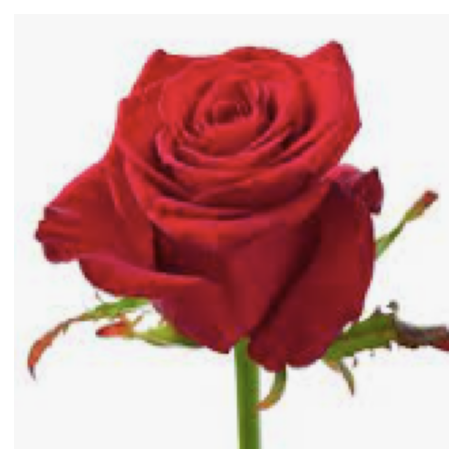

In [ ]:
filename = 'flower2.png'
show_and_predict_image(img_dir_path, filename)

dandelion: 0 daisy: 100 tulip 0 sunflower 0 rose 0


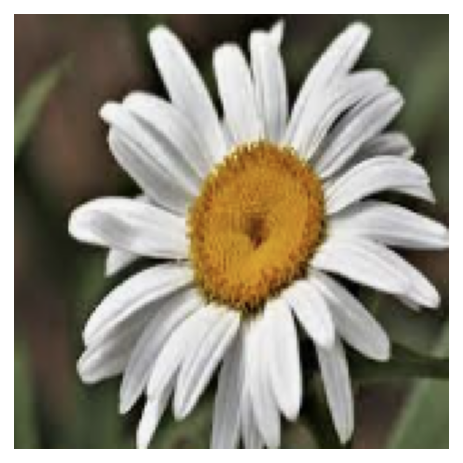

In [ ]:
filename = 'flower3.png'
show_and_predict_image(img_dir_path, filename)